# Lab11-2_108032053

## 1. A Neural Algorithm of Artistic Style

### 1.1 Download data

In [1]:
import tensorflow as tf
import numpy as np
import time
import functools
import IPython.display as display
from pathlib import Path
import random
from PIL import Image
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
import urllib.request
from tqdm import tqdm

mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

os.environ['TF_ENABLE_AUTO_MIXED_PRECISION'] = '0'

2023-11-11 02:17:55.312466: I tensorflow/core/platform/cpu_feature_guard.cc:183] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE3 SSE4.1 SSE4.2 AVX, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
DOWNLOAD_URL_1 = "https://nthu-datalab.github.io/ml/labs/11-2_Visualization_Style-Transfer/dataset/content_nthu.jpg"
DOWNLOAD_URL_2 = "https://nthu-datalab.github.io/ml/labs/11-2_Visualization_Style-Transfer/dataset/style_starry_night.jpg"

if not os.path.exists("dataset"):
    os.mkdir("dataset")

if not os.path.exists("dataset/content_nthu.jpg"):
    urllib.request.urlretrieve(DOWNLOAD_URL_1, "dataset/content_nthu.jpg")

if not os.path.exists("dataset/style_starry_night.jpg"):
    urllib.request.urlretrieve(DOWNLOAD_URL_2, "dataset/style_starry_night.jpg")

In [3]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    # in order to use CNN, add one additional dimension 
    # to the original image
    # img shape: [height, width, channel] -> [batch_size, height, width, channel]
    img = img[tf.newaxis, :]
    
    return img


def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)

    plt.imshow(image)
    if title:
        plt.title(title)

2023-11-11 01:08:40.757161: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1636] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 31136 MB memory:  -> device: 0, name: Tesla V100-SXM2-32GB, pci bus id: 0000:1b:00.0, compute capability: 7.0


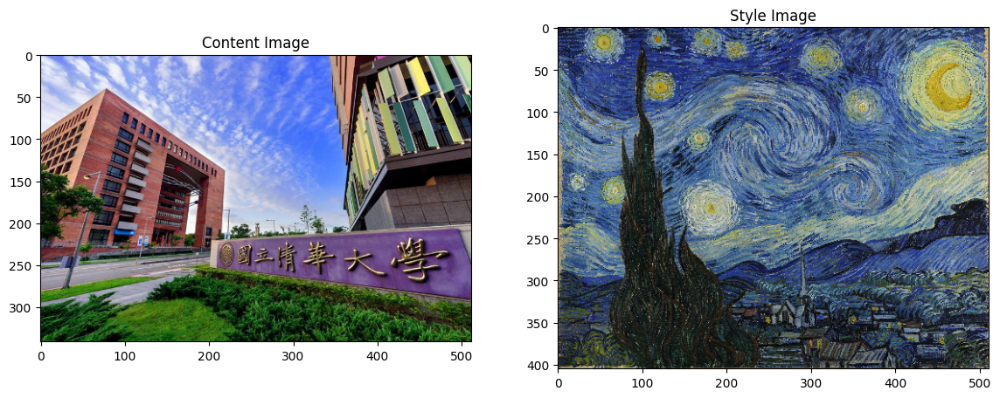

In [4]:
content_path = './dataset/content_nthu.jpg'
style_path = './dataset/style_starry_night.jpg'

content_image = load_img(content_path)
style_image = load_img(style_path)

plt.figure(figsize=(14,10))
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

### 1.2 Define model

In [6]:
def vgg_layers(layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    # Load our model. Load pretrained VGG, trained on imagenet data
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    outputs = [vgg.get_layer(name).output for name in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model


def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / (num_locations)


class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg =  vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        "Expects float input in [0,1]"
        inputs = inputs * 255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                                          outputs[self.num_style_layers:])

        style_outputs = [gram_matrix(style_output)
                         for style_output in style_outputs]

        content_dict = {content_name:value 
                        for content_name, value 
                        in zip(self.content_layers, content_outputs)}

        style_dict = {style_name:value
                      for style_name, value
                      in zip(self.style_layers, style_outputs)}

        return {'content':content_dict, 'style':style_dict}

### 1.3 Training

In [17]:
# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer of interest
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

# Extract features
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

image = tf.Variable(content_image)
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# Set weight of each loss
style_weight = 1
content_weight = 1
total_variation_weight = 1

In [18]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name]) ** 2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name]) ** 2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss


def total_variation_loss(image):
    # TODO
    x = image[:, 1:, :, :] - image[:, :-1, :, :]
    y = image[:, :, 1:, :] - image[:, :, :-1, :]

    return tf.reduce_mean(tf.abs(x)) + tf.reduce_mean(tf.abs(y))


def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)


@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight * total_variation_loss(image)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

100%|██████████| 1000/1000 [00:16<00:00, 60.92it/s]


Total time: 16.4


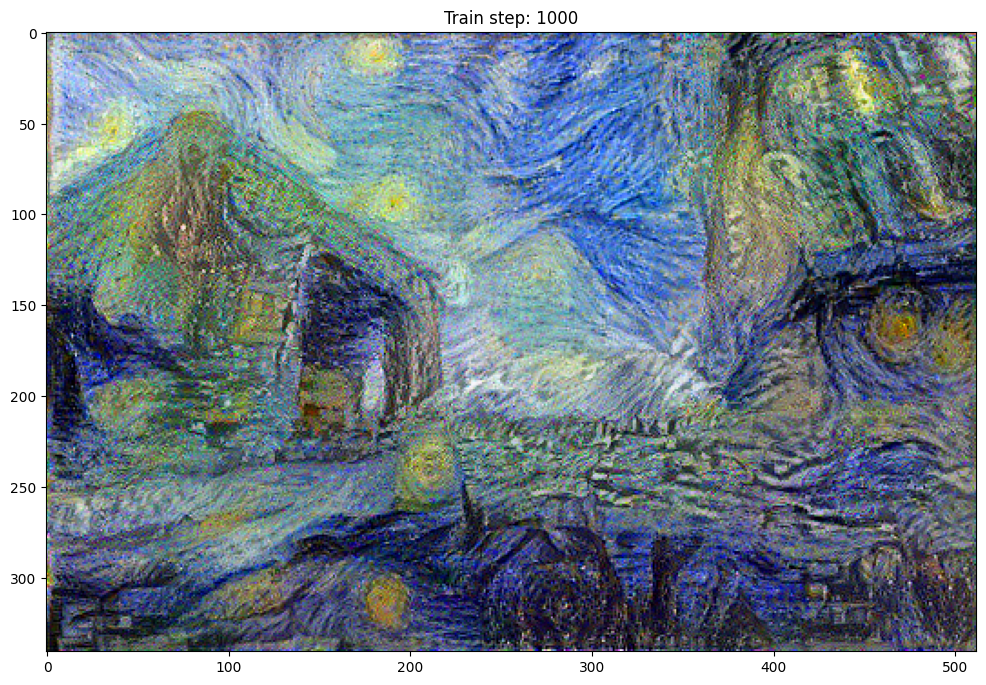

In [19]:
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in tqdm(range(steps_per_epoch * epochs)):
    step += 1
    train_step(image)

end = time.time()
print("Total time: {:.1f}".format(end - start))

# Show the final image
imshow(image.read_value())
plt.title("Train step: {}".format(step))
plt.show()

### 1.4 Change the weights

In [10]:
# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer of interest
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

# Extract features
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

image = tf.Variable(content_image)
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# Set weight of each loss
style_weight = 1e0
content_weight = 1e5
total_variation_weight = 1e7

In [11]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name]) ** 2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name]) ** 2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss


def total_variation_loss(image):
    x = image[:, 1:, :, :] - image[:, :-1, :, :]
    y = image[:, :, 1:, :] - image[:, :, :-1, :]

    return tf.reduce_mean(tf.abs(x)) + tf.reduce_mean(tf.abs(y))


def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)


@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight * total_variation_loss(image)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

100%|██████████| 1000/1000 [00:16<00:00, 60.48it/s]


Total time: 16.5


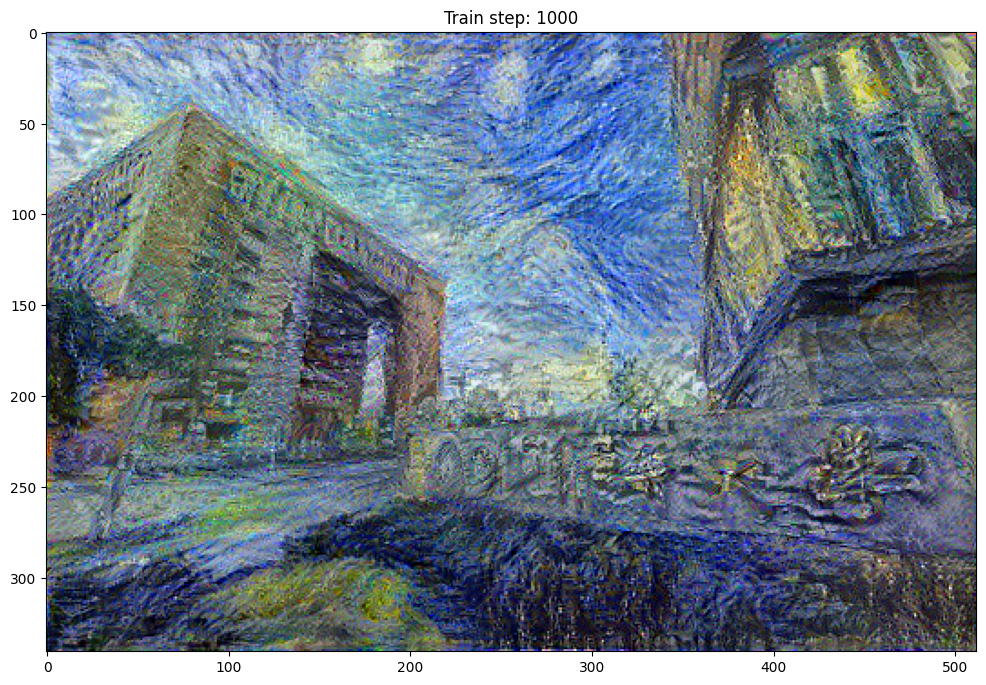

In [12]:
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in tqdm(range(steps_per_epoch * epochs)):
    step += 1
    train_step(image)

end = time.time()
print("Total time: {:.1f}".format(end - start))

# Show the final image
imshow(image.read_value())
plt.title("Train step: {}".format(step))
plt.show()

### 1.5 Use other layers in the model

In [13]:
# Content layer where will pull our feature maps
content_layers = ['block3_conv2'] 

# Style layer of interest
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

# Extract features
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

image = tf.Variable(content_image)
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# Set weight of each loss
style_weight = 1e0
content_weight = 1e5
total_variation_weight = 1e7

In [14]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name]) ** 2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name]) ** 2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss


def total_variation_loss(image):
    x = image[:, 1:, :, :] - image[:, :-1, :, :]
    y = image[:, :, 1:, :] - image[:, :, :-1, :]

    return tf.reduce_mean(tf.abs(x)) + tf.reduce_mean(tf.abs(y))


def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)


@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight * total_variation_loss(image)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

100%|██████████| 1000/1000 [00:16<00:00, 62.21it/s]


Total time: 16.1


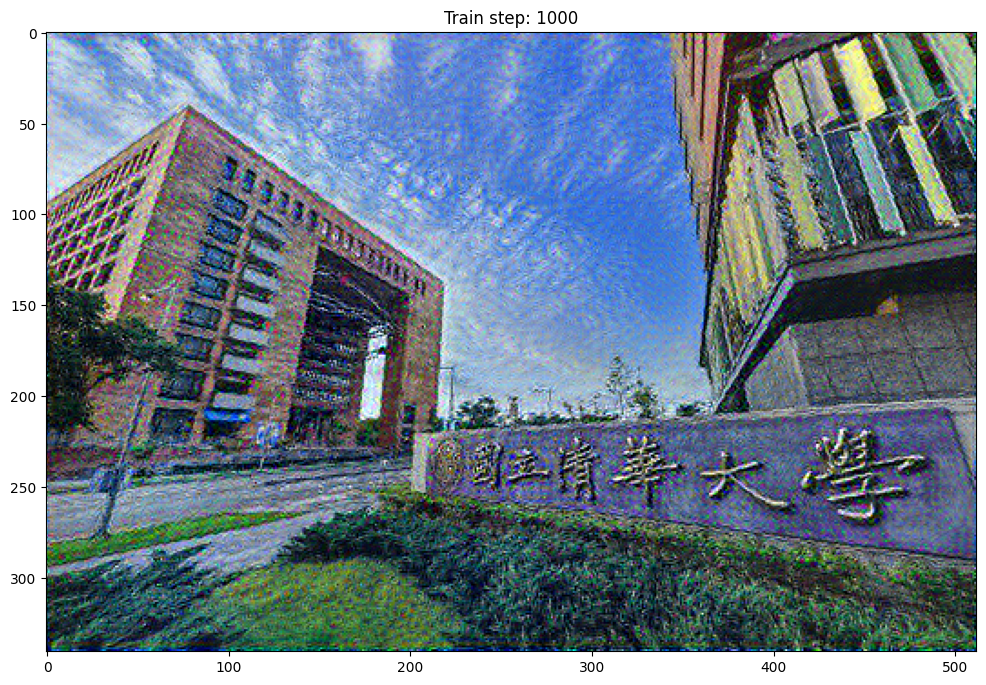

In [15]:
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in tqdm(range(steps_per_epoch * epochs)):
    step += 1
    train_step(image)

end = time.time()
print("Total time: {:.1f}".format(end - start))

# Show the final image
imshow(image.read_value())
plt.title("Train step: {}".format(step))
plt.show()

### 1.6 Report

#### Change the weights

在改變weights時，首先需要注意3種weights的數量級，一開始我直接設成1:1:1，整張圖明顯style weight過重，風格過於藝術，content的資訊幾乎都不見了，因此我將content weight調整至1e5，可以辨識出content的樣子且也帶有style的風格。接著我再將variation weight調整至1e7，讓圖像的曲線變的較為柔和，更加自然。

最後我的weights為style:content:variation = 1:1e5:1e7，整體樣子接近於助教提供的範本，保持content的整體性與style的風格，並且不會太過銳利，較為柔和自然。

#### Use other layers in the model

我將content layer換成較為淺層的layer，可以發現越淺層的layer作為content layer時，會比較關注在小細節上。在相同的weight下，圖片結果會幾乎維持成像原先的content，效果比較不好。如果使用深層的content layer，就越能擁有整體的資訊，更具代表性，合成後的照片效果也會更好。

## 2. AdaIN

### 2.1 Donwload data

In [20]:
import zipfile

DOWNLOAD_URL_1 = "https://drive.google.com/u/1/uc?id=1gNfHcQ2onGHd0WVonKbKzsnMv3B4tKaK&export=download"
DOWNLOAD_URL_2 = "https://drive.google.com/u/1/uc?id=1rpjn28IKpirohdu8DBpnTqJa0RRa59XS&export=download"

if not os.path.exists("dataset"):
    os.mkdir("dataset")

if not os.path.exists("dataset/mscoco"):
    os.mkdir("dataset/mscoco")

if not os.path.exists("dataset/wikiart"):
    os.mkdir("dataset/wikiart")    

if not os.path.exists("dataset/mscoco/test2014"):
    try:
        import gdown
        gdown.download(DOWNLOAD_URL_1, "dataset/mscoco/test2014.zip")
        with zipfile.ZipFile("dataset/mscoco/test2014.zip", "r") as f:
            f.extractall("dataset/mscoco")
        print("Donwload successfully.")
    except:
        print("Can't download the file.")

if not os.path.exists("dataset/wikiart/test"):
    try:
        import gdown
        gdown.download(DOWNLOAD_URL_2, "dataset/wikiart/test.zip")
        with zipfile.ZipFile("dataset/wikiart/test.zip", "r") as f:
            f.extractall("dataset/wikiart")
        print("Donwload successfully.")
    except:
        print("Can't download the file.")

### 2.2 Preprocess data

In [2]:
CONTENT_DIRS = ['./dataset/mscoco/test2014']
STYLE_DIRS = ['./dataset/wikiart/test']

# VGG19 was trained by Caffe which converted images from RGB to BGR,
# then zero-centered each color channel with respect to the ImageNet 
# dataset, without scaling.  
IMG_MEANS = np.array([103.939, 116.779, 123.68]) # BGR

IMG_SHAPE = (224, 224, 3) # training image shape, (h, w, c)
SHUFFLE_BUFFER = 1000
BATCH_SIZE = 32
EPOCHS = 30
STEPS_PER_EPOCH = 12000 // BATCH_SIZE

In [17]:
def clean(dir_path, min_shape=None):
    paths = Path(dir_path).glob('**/*.jpg')
    deleted  = 0
    for path in paths:
        try:
            # Make sure we can decode the image
            im = tf.io.read_file(str(path.resolve()))
            im = tf.image.decode_jpeg(im)

            # Remove grayscale images 
            shape = im.shape
            if shape[2] < 3:
                path.unlink()
                deleted += 1

            # Remove small images
            if min_shape is not None:
                if shape[0] < min_shape[0] or shape[1] < min_shape[1]:
                    path.unlink()
                    deleted += 1
        except Exception as e:
            path.unlink()
            deleted += 1
    return deleted

for dir in CONTENT_DIRS:
    deleted = clean(dir)
print(f'#Deleted content images: {deleted}')

for dir in STYLE_DIRS:
    deleted = clean(dir)
print(f'#Deleted style images: {deleted}')

2023-11-11 00:20:47.470507: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1636] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 31136 MB memory:  -> device: 0, name: Tesla V100-SXM2-32GB, pci bus id: 0000:1b:00.0, compute capability: 7.0


#Deleted content images: 39


Input file read error
Corrupt JPEG data: 10 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
2023-11-11 00:34:46.674064: E tensorflow/core/lib/jpeg/jpeg_mem.cc:324] Premature end of JPEG data. Stopped at line 2334/2646
2023-11-11 00:34:58.969240: E tensorflow/core/lib/jpeg/jpeg_mem.cc:183] Image too large: 2064870000
2023-11-11 00:35:22.925749: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
Corrupt JPEG data: 3909 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
2023-11-11 00:37:51.741442: E tensorflow/core/lib/jpeg/jpeg_mem.cc:183] Image too large: 1469250000
2023-11-11 00:38:37.418539: E tensorflow/core/lib/jpeg/jpeg_mem.cc:324] Premature end of JPEG data. Stopped at line 1038/1074
Corrupt JPEG data: 6 extraneous bytes before marker 0xda


#Deleted style images: 232


In [4]:
def preprocess_image(path, init_shape=(448, 448)):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, init_shape)
    image = tf.image.random_crop(image, size=IMG_SHAPE)
    image = tf.cast(image, tf.float32)
    
    # Convert image from RGB to BGR, then zero-center each color channel with
    # respect to the ImageNet dataset, without scaling.
    image = image[..., ::-1] # RGB to BGR
    image -= (103.939, 116.779, 123.68) # BGR means
    return image


def np_image(image):
    image += (103.939, 116.779, 123.68) # BGR means
    image = image[..., ::-1] # BGR to RGB
    image = tf.clip_by_value(image, 0, 255)
    image = tf.cast(image, dtype='uint8')
    return image.numpy()


def build_dataset(num_gpus=1):
    c_paths = []
    for c_dir in CONTENT_DIRS:
        c_paths += Path(c_dir).glob('*.jpg')
    c_paths = [str(path.resolve()) for path in c_paths]
    s_paths = []
    for s_dir in STYLE_DIRS:
        s_paths += Path(s_dir).glob('*.jpg')
    s_paths = [str(path.resolve()) for path in s_paths]
    print(f'Building dataset from {len(c_paths):,} content images and {len(s_paths):,} style images... ', end='')

    AUTOTUNE = tf.data.experimental.AUTOTUNE

    c_ds = tf.data.Dataset.from_tensor_slices(c_paths)
    c_ds = c_ds.map(preprocess_image, num_parallel_calls=AUTOTUNE)
    c_ds = c_ds.repeat()
    c_ds = c_ds.shuffle(buffer_size=SHUFFLE_BUFFER)

    s_ds = tf.data.Dataset.from_tensor_slices(s_paths)
    s_ds = s_ds.map(preprocess_image, num_parallel_calls=AUTOTUNE)
    s_ds = s_ds.repeat()
    s_ds = s_ds.shuffle(buffer_size=SHUFFLE_BUFFER)

    ds = tf.data.Dataset.zip((c_ds, s_ds))
    ds = ds.batch(BATCH_SIZE * num_gpus)
    ds = ds.prefetch(buffer_size=AUTOTUNE)

    print('done')
    return ds

Building dataset from 40,736 content images and 23,585 style images... 

2023-11-11 02:18:27.087121: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1636] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 31136 MB memory:  -> device: 0, name: Tesla V100-SXM2-32GB, pci bus id: 0000:1b:00.0, compute capability: 7.0
2023-11-11 02:18:27.546098: W tensorflow/compiler/jit/mark_for_compilation_pass.cc:1794] (One-time warning): Not using XLA:CPU for cluster.

If you want XLA:CPU, do one of the following:

 - set the TF_XLA_FLAGS to include "--tf_xla_cpu_global_jit", or
 - set cpu_global_jit to true on this session's OptimizerOptions, or
 - use experimental_jit_scope, or
 - use tf.function(jit_compile=True).

To confirm that XLA is active, pass --vmodule=xla_compilation_cache=1 (as a
proper command-line flag, not via TF_XLA_FLAGS).


done


Corrupt JPEG data: 10 extraneous bytes before marker 0xd9


Content batch shape: (32, 224, 224, 3)
Style batch shape: (32, 224, 224, 3)


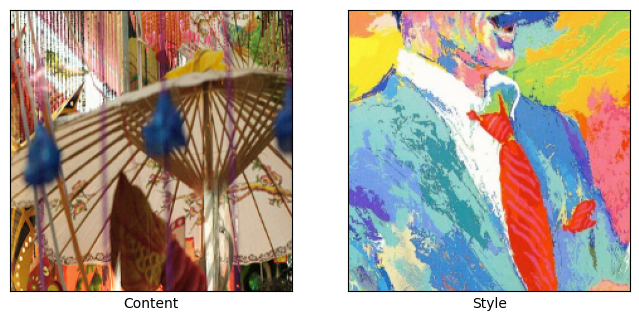

In [5]:
ds = build_dataset()
c_batch, s_batch = next(iter(ds.take(1)))

print('Content batch shape:', c_batch.shape)
print('Style batch shape:', s_batch.shape)

plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(np_image(c_batch[0]))
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.xlabel('Content')

plt.subplot(1, 2, 2)
plt.imshow(np_image(s_batch[0]))
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.xlabel('Style')

plt.show()

### 2.3 Define model

In [6]:
class AdaIN(tf.keras.layers.Layer):
    # TODO
    def __init__(self, name='adain', epsilon=1e-5):
        super(AdaIN, self).__init__(name=name)
        self.epsilon = epsilon
        
    def call(self, inputs):
        content, style = inputs
        
        content_mean, content_var = tf.nn.moments(content, [1, 2], keepdims=True)
        style_mean, style_var = tf.nn.moments(style, [1, 2], keepdims=True)
        normalized_content = tf.nn.batch_normalization(content, content_mean, content_var, \
                                                       style_mean, tf.sqrt(style_var), self.epsilon)
        return normalized_content
        
    
class ArbitraryStyleTransferNet(tf.keras.Model):
    CONTENT_LAYER = 'block4_conv1'
    STYLE_LAYERS = ('block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1')

    @staticmethod
    def declare_decoder():
        a_input = tf.keras.Input(shape=(28, 28, 512), name='input_adain')

        h = tf.keras.layers.Conv2DTranspose(256, 3, padding='same', activation='relu')(a_input)
        h = tf.keras.layers.UpSampling2D(2)(h)
        h = tf.keras.layers.Conv2DTranspose(256, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.Conv2DTranspose(256, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.Conv2DTranspose(256, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.Conv2DTranspose(128, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.UpSampling2D(2)(h)
        h = tf.keras.layers.Conv2DTranspose(128, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.Conv2DTranspose(64, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.UpSampling2D(2)(h)
        h = tf.keras.layers.Conv2DTranspose(64, 3, padding='same', activation='relu')(h)
        output = tf.keras.layers.Conv2DTranspose(3, 3, padding='same')(h)

        return tf.keras.Model(inputs=a_input, outputs=output, name='decoder')
  
    def __init__(self,
                 img_shape=(224, 224, 3),
                 content_loss_weight=1,
                 style_loss_weight=10,
                 name='arbitrary_style_transfer_net',
                 **kwargs):
        super(ArbitraryStyleTransferNet, self).__init__(name=name, **kwargs)

        self.img_shape = img_shape
        self.content_loss_weight = content_loss_weight
        self.style_loss_weight = style_loss_weight
        
        vgg19 = tf.keras.applications.VGG19(include_top=False, weights='imagenet', input_shape=img_shape)
        vgg19.trainable = False

        c_output = [vgg19.get_layer(ArbitraryStyleTransferNet.CONTENT_LAYER).output]
        s_outputs = [vgg19.get_layer(name).output for name in ArbitraryStyleTransferNet.STYLE_LAYERS]
        self.vgg19 = tf.keras.Model(inputs=vgg19.input, outputs=c_output+s_outputs, name='vgg19')
        self.vgg19.trainable = False

        self.adain = AdaIN(name='adain')
        self.decoder = ArbitraryStyleTransferNet.declare_decoder()
  
    def call(self, inputs):
        c_batch, s_batch = inputs

        c_enc = self.vgg19(c_batch)
        c_enc_c = c_enc[0]

        s_enc = self.vgg19(s_batch)
        s_enc_c = s_enc[0]
        s_enc_s = s_enc[1:] 
        
        # normalized_c is the output of AdaIN layer
        normalized_c = self.adain((c_enc_c, s_enc_c))
        output = self.decoder(normalized_c)

        # Calculate loss
        out_enc = self.vgg19(output)
        out_enc_c = out_enc[0]
        out_enc_s = out_enc[1:]

        loss_c = tf.reduce_mean(tf.math.squared_difference(out_enc_c, normalized_c))
        self.add_loss(self.content_loss_weight * loss_c)
        
        loss_s = 0
        for o, s in zip(out_enc_s, s_enc_s):    
            o_mean, o_var = tf.nn.moments(o, axes=(1,2), keepdims=True)
            o_std = tf.sqrt(o_var + self.adain.epsilon)

            s_mean, s_var = tf.nn.moments(s, axes=(1,2), keepdims=True)
            s_std = tf.sqrt(s_var + self.adain.epsilon)

            loss_mean = tf.reduce_mean(tf.math.squared_difference(o_mean, s_mean))
            loss_std = tf.reduce_mean(tf.math.squared_difference(o_std, s_std))

            loss_s += loss_mean + loss_std
        self.add_loss(self.style_loss_weight * loss_s)

        return output, c_enc_c, normalized_c, out_enc_c


# Plot results
def plot_outputs(outputs, captions=None, col=5):
    row = len(outputs)
    plt.figure(figsize=(3*col, 3*row))
    for i in range(col):
        for j in range(row):
            plt.subplot(row, col, j*col+i+1)
            plt.imshow(np_image(outputs[j][i,...,:3]))
            plt.grid(False)
            plt.xticks([])
            plt.yticks([])
            if captions is not None:
                plt.xlabel(captions[j])
    plt.show()

In [7]:
ds = build_dataset()
model = ArbitraryStyleTransferNet(img_shape=IMG_SHAPE)

c_batch, s_batch = next(iter(ds.take(1)))
print(f'Input shape: ({c_batch.shape}, {s_batch.shape})')
output, *_ = model((c_batch, s_batch))
print(f'Output shape: {output.shape}')
print(f'Init. content loss: {model.losses[0]:,.2f}, style loss: {model.losses[1]:,.2f}')
model.summary()

Building dataset from 40,736 content images and 23,585 style images... done


Corrupt JPEG data: 10 extraneous bytes before marker 0xd9


Input shape: ((32, 224, 224, 3), (32, 224, 224, 3))


2023-11-11 02:18:56.741688: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8904


Output shape: (32, 224, 224, 3)
Init. content loss: 1,928,486.38, style loss: 12,371,896.00
Model: "arbitrary_style_transfer_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          [(None, 28, 28, 512),     3505728   
                              (None, 224, 224, 64),              
                              (None, 112, 112, 128),             
                              (None, 56, 56, 256),               
                              (None, 28, 28, 512)]               
                                                                 
 adain (AdaIN)               multiple                  0         
                                                                 
 decoder (Functional)        (None, 224, 224, 3)       3505219   
                                                                 
Total params: 7010947 (26.74 MB)
Trainable params: 3505219 (13.37 MB)
Non-trai

### 2.4 Training

In [8]:
# Train the model
optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)
c_loss_metric, s_loss_metric = tf.keras.metrics.Mean(), tf.keras.metrics.Mean()

CKP_DIR = 'checkpoints'
init_epoch = 1

ckp = tf.train.latest_checkpoint(CKP_DIR)
if ckp:
    model.load_weights(ckp)
    init_epoch = int(ckp.split('_')[-1]) + 1
    print(f'Resume training from epoch {init_epoch-1}')

Resume training from epoch 30


In [9]:
@tf.function
def train_step(inputs):
    with tf.GradientTape() as tape:
        model(inputs)
        c_loss, s_loss = model.losses
        loss = c_loss + s_loss
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

    c_loss_metric(c_loss)
    s_loss_metric(s_loss)

In [10]:
def train(dataset, init_epoch):
    start = time.time()
    
    for epoch in range(init_epoch, EPOCHS+1):
        print(f'Epoch {epoch:>2}/{EPOCHS}')
        for step, inputs in enumerate(ds.take(STEPS_PER_EPOCH)):
            train_step(inputs)
            # print(f'{step+1:>5}/{STEPS_PER_EPOCH} - loss: {c_loss_metric.result()+s_loss_metric.result():,.2f} - content loss: {c_loss_metric.result():,.2f} - style loss: {s_loss_metric.result():,.2f}', end='\r') 

        print()
        model.save_weights(os.path.join(CKP_DIR, f'ckpt_{epoch}'))
        c_loss_metric.reset_states()
        s_loss_metric.reset_states()

        output, c_enc_c, normalized_c, out_enc_c = model((c_batch, s_batch))
        # plot_outputs((s_batch, c_batch, output, c_enc_c, normalized_c, out_enc_c), 
        #              ('Style', 'Content', 'Trans', 'Content Enc', 'Normalized', 'Trans Enc'))
        
    end = time.time()
    print("\nTotal time: {:.1f}".format(end - start))
        

train(ds, init_epoch)


Total time: 0.0


### 2.5 Testing

Building dataset from 40,736 content images and 23,585 style images... done


Corrupt JPEG data: 10 extraneous bytes before marker 0xd9


Recovered loss: 606307.9


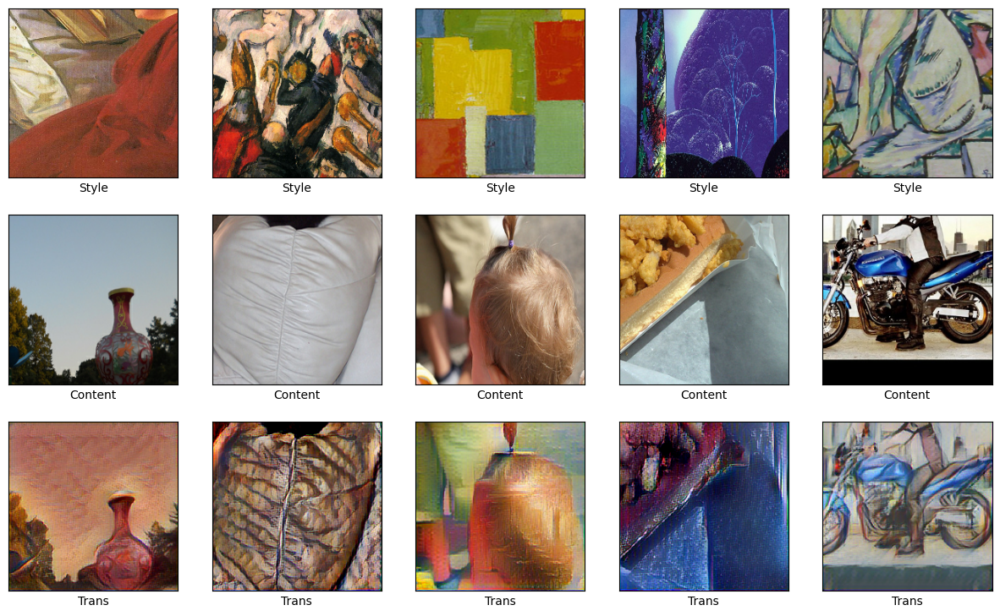

Recovered loss: 589114.75


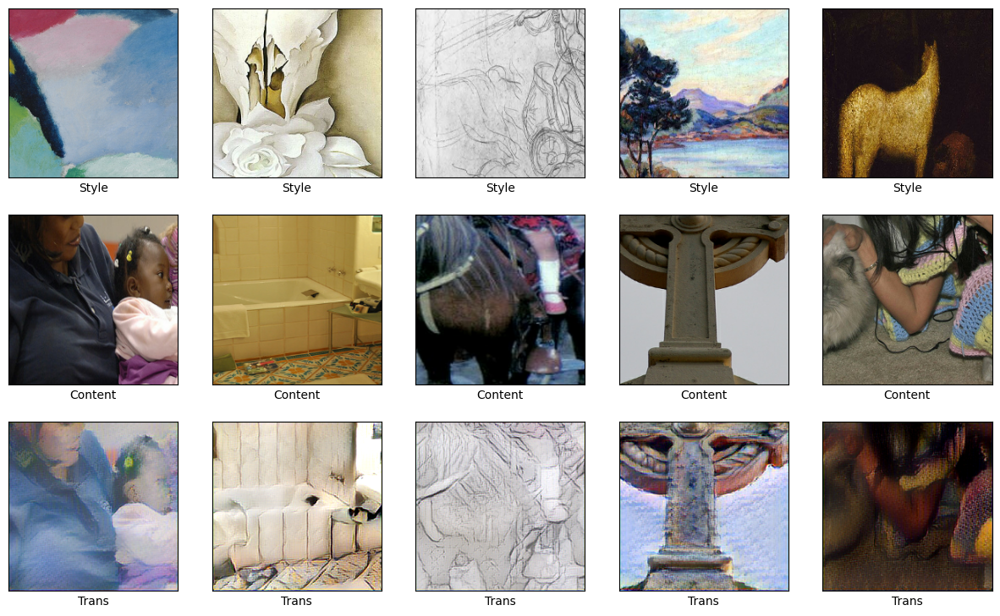

In [11]:
CKP_DIR = 'checkpoints/ckpt_30'

model = ArbitraryStyleTransferNet(img_shape=IMG_SHAPE)
model.load_weights(CKP_DIR)

ds = build_dataset()

for idx, (c_batch, s_batch) in enumerate(ds):
    if idx > 1:
        break
    output, c_enc_c, normalized_c, out_enc_c = model((c_batch, s_batch))
    print('Recovered loss:', tf.reduce_sum(model.losses).numpy())

    plot_outputs((s_batch, c_batch, output), ('Style', 'Content', 'Trans'))

In [12]:
def preprocess_example(path, init_shape=(IMG_SHAPE[0], IMG_SHAPE[1])):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, init_shape)
    image = tf.cast(image, tf.float32)
    
    # Convert image from RGB to BGR, then zero-center each color channel with
    # respect to the ImageNet dataset, without scaling.
    image = image[..., ::-1] # RGB to BGR
    image -= (103.939, 116.779, 123.68) # BGR means
    return image


def nthu_example(num_gpus=1):
    c_paths = ['./dataset/content_nthu.jpg']
    
    s_paths = []
    for s_dir in STYLE_DIRS:
        s_paths += Path(s_dir).glob('*.jpg')
    s_paths = [str(path.resolve()) for path in s_paths]
    print(f'Building dataset from {len(c_paths):,} content images and {len(s_paths):,} style images... ', end='')
    
    AUTOTUNE = tf.data.experimental.AUTOTUNE
    
    c_ds = tf.data.Dataset.from_tensor_slices(c_paths)
    c_ds = c_ds.map(preprocess_example, num_parallel_calls=AUTOTUNE)
    c_ds = c_ds.repeat()
    c_ds = c_ds.shuffle(buffer_size=SHUFFLE_BUFFER)
    
    s_ds = tf.data.Dataset.from_tensor_slices(s_paths)
    s_ds = s_ds.map(preprocess_image, num_parallel_calls=AUTOTUNE)
    s_ds = s_ds.repeat()
    s_ds = s_ds.shuffle(buffer_size=SHUFFLE_BUFFER)
    
    ds = tf.data.Dataset.zip((c_ds, s_ds))
    ds = ds.batch(BATCH_SIZE * num_gpus)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    
    print('done')
    return ds

Building dataset from 1 content images and 23,585 style images... done


Corrupt JPEG data: 10 extraneous bytes before marker 0xd9


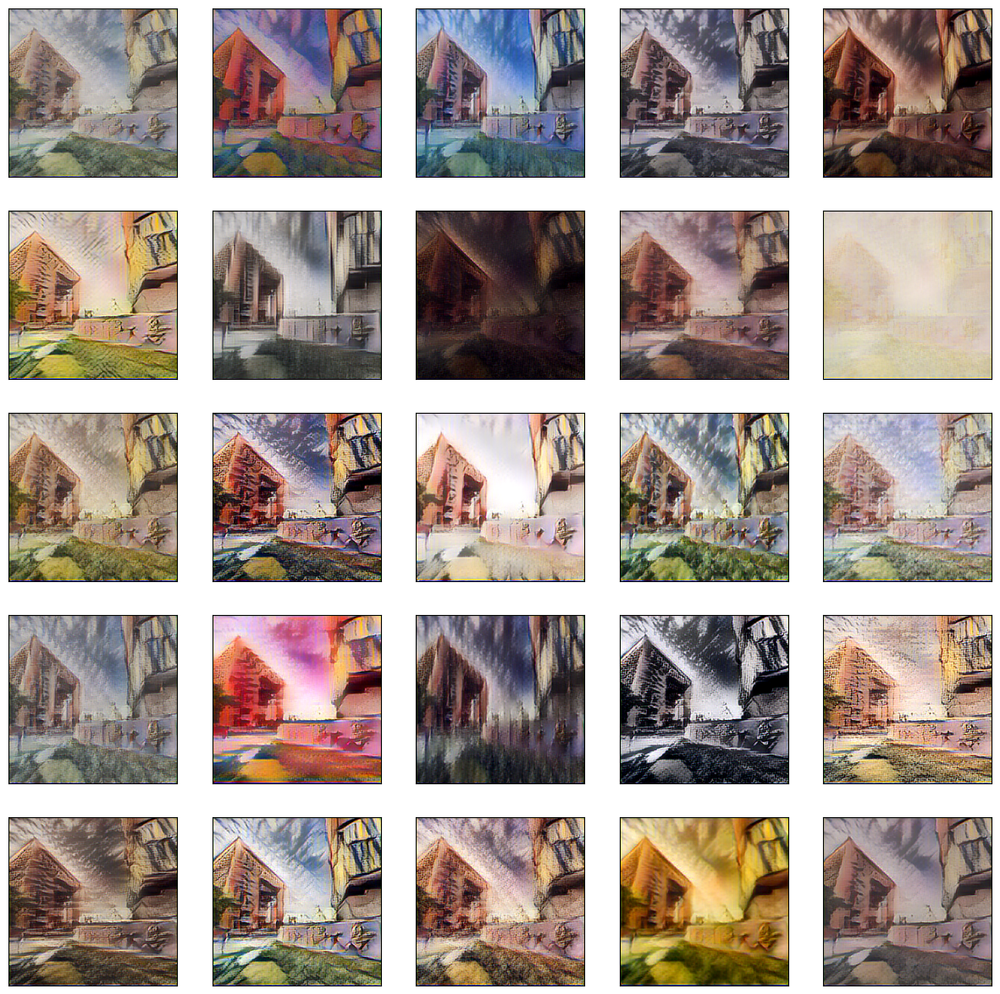

In [13]:
ds = nthu_example()
outputs = []

for idx, (c_batch, s_batch) in enumerate(ds):
    if idx > 4:
        break
    output, c_enc_c, normalized_c, out_enc_c = model((c_batch, s_batch))
    outputs.append(output)
    
plot_outputs((outputs))